In [1]:
import numpy as np
import pandas as pd
import pandas_profiling
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.naive_bayes import CategoricalNB, GaussianNB

In [2]:
data = pd.read_csv("winequality-red.csv")
wine = pd.read_csv("winequality-red.csv")

In [3]:
data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [5]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,1599.0,8.319637,1.741096,4.60000,7.1000,7.90000,9.200000,15.90000
volatile acidity,1599.0,0.527821,0.179060,0.12000,0.3900,0.52000,0.640000,1.58000
citric acid,1599.0,0.270976,0.194801,0.00000,0.0900,0.26000,0.420000,1.00000
residual sugar,1599.0,2.538806,1.409928,0.90000,1.9000,2.20000,2.600000,15.50000
chlorides,1599.0,0.087467,0.047065,0.01200,0.0700,0.07900,0.090000,0.61100
free sulfur dioxide,1599.0,15.874922,10.460157,1.00000,7.0000,14.00000,21.000000,72.00000
total sulfur dioxide,1599.0,46.467792,32.895324,6.00000,22.0000,38.00000,62.000000,289.00000
density,1599.0,0.996747,0.001887,0.99007,0.9956,0.99675,0.997835,1.00369
pH,1599.0,3.311113,0.154386,2.74000,3.2100,3.31000,3.400000,4.01000
sulphates,1599.0,0.658149,0.169507,0.33000,0.5500,0.62000,0.730000,2.00000


In [6]:
data.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [7]:
# EDA

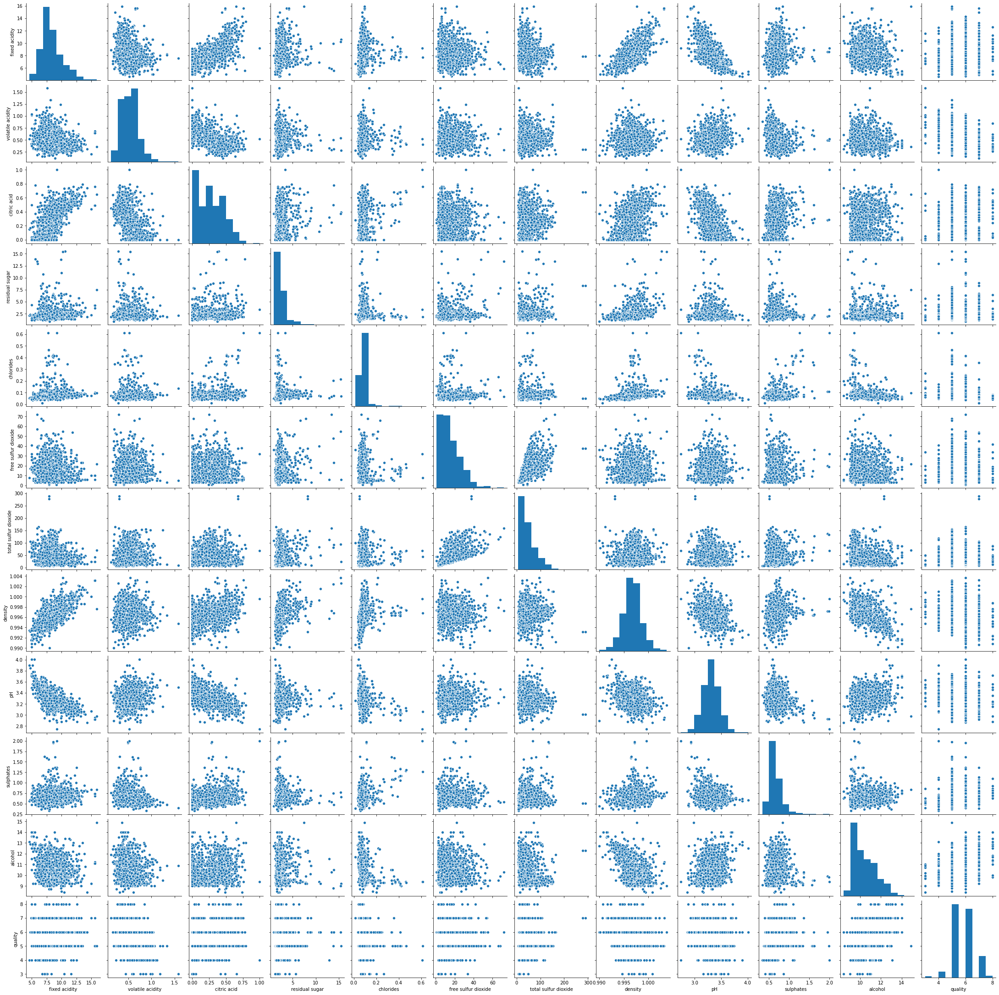

In [8]:
sns.pairplot(data)

In [9]:
data["quality"] = data["quality"].map({3:"Bad",4:"Bad",5:"Average",6:"Average",7:"Good",8:"Good"})

In [10]:
data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,Average
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,Average
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,Average
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,Average
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,Average


In [11]:
for x in data.columns:
    figure = px.histogram(data,x=x,color="quality",title=x)
    figure.show()

In [12]:
for x in wine.columns:
    figure = px.histogram(data,x=x,color="quality",title=x)
    figure.show()

In [13]:
# Fixed Acidity

Text(0, 0.5, 'Avg Acidity')

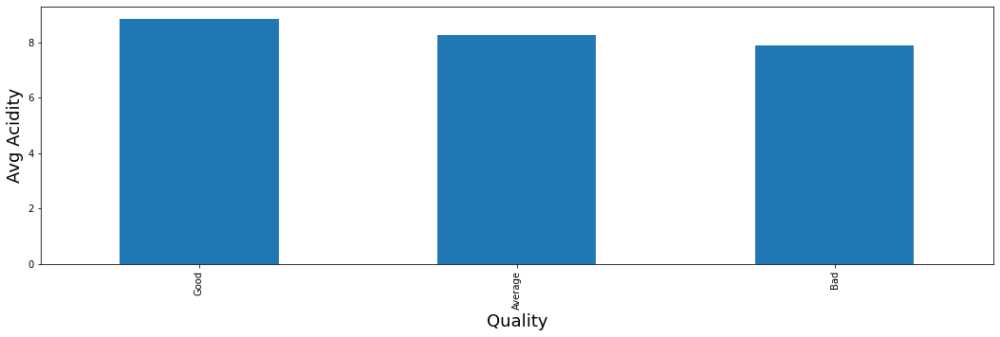

In [14]:
plt.figure(figsize=(18,5))

data.groupby("quality")["fixed acidity"].mean().sort_values(ascending=False).plot(kind="bar")
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Avg Acidity",fontsize=18)

Text(0, 0.5, 'Avg Acidity')

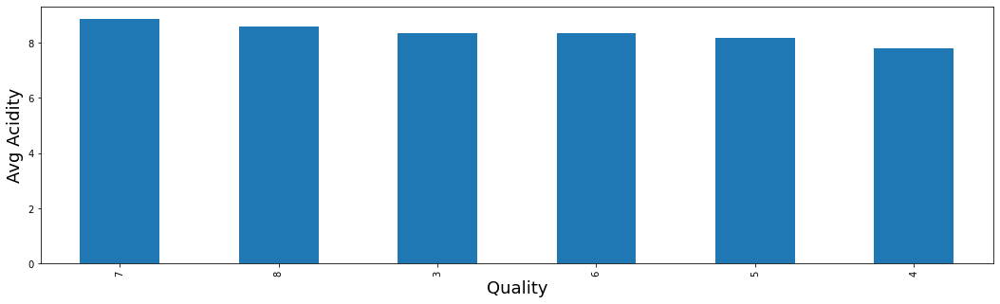

In [15]:
plt.figure(figsize=(18,5))

wine.groupby("quality")["fixed acidity"].mean().sort_values(ascending=False).plot(kind="bar")
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Avg Acidity",fontsize=18)

Text(0, 0.5, 'fixed Acidity')

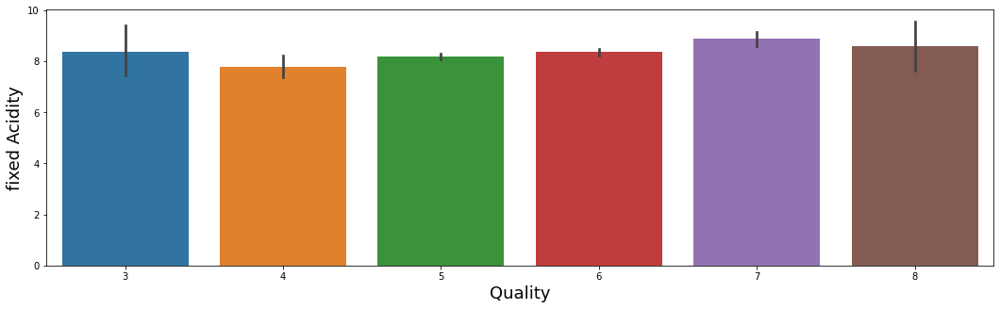

In [16]:
plt.figure(figsize=(18,5))

sns.barplot(wine["quality"],wine["fixed acidity"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("fixed Acidity",fontsize=18)

Text(0, 0.5, 'fixed Acidity')

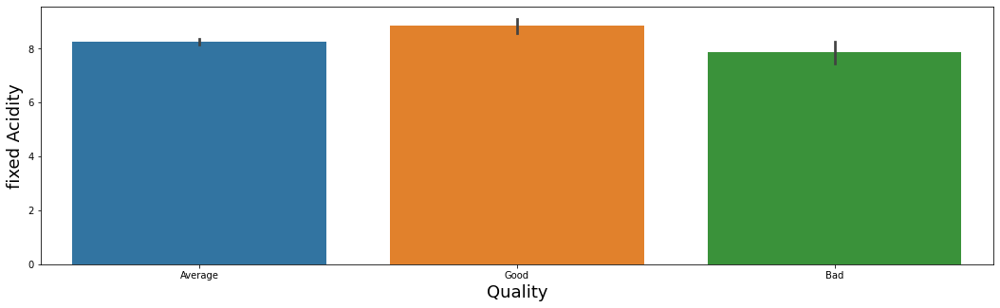

In [17]:
plt.figure(figsize=(18,5))

sns.barplot(data["quality"],data["fixed acidity"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("fixed Acidity",fontsize=18)

In [18]:
plt.figure(figsize=(18,5))

px.scatter(wine,x="alcohol",y="fixed acidity",color="quality")


<Figure size 1296x360 with 0 Axes>

In [19]:
px.box(wine, y = "fixed acidity",color="quality")

In [20]:
px.box(data, y = "fixed acidity",color="quality")

In [21]:
# Volatile Acidity

Text(0, 0.5, 'Volatile Acidity')

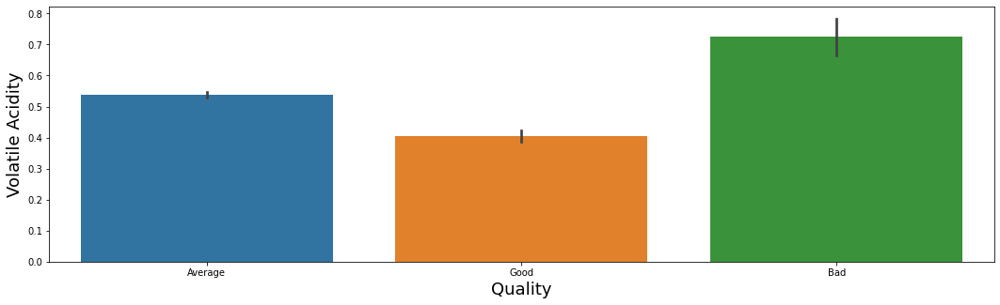

In [22]:
plt.figure(figsize=(18,5))

sns.barplot(data["quality"],data["volatile acidity"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Volatile Acidity",fontsize=18)

Text(0, 0.5, 'volatile Acidity')

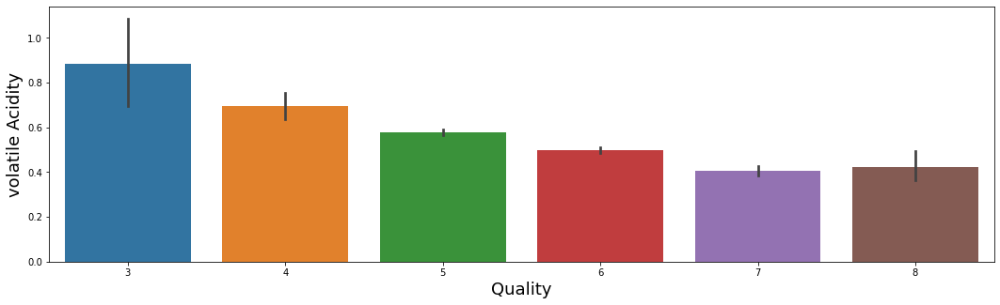

In [23]:
plt.figure(figsize=(18,5))

sns.barplot(wine["quality"],wine["volatile acidity"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("volatile Acidity",fontsize=18)

In [24]:
plt.figure(figsize=(18,5))

px.scatter(wine,x="alcohol",y="volatile acidity",color="quality")


<Figure size 1296x360 with 0 Axes>

In [25]:
px.box(wine, y = "volatile acidity",color="quality")

In [26]:
px.box(data, y = "volatile acidity",color="quality")

In [27]:
# Citric Acid

Text(0, 0.5, 'Citric Acid')

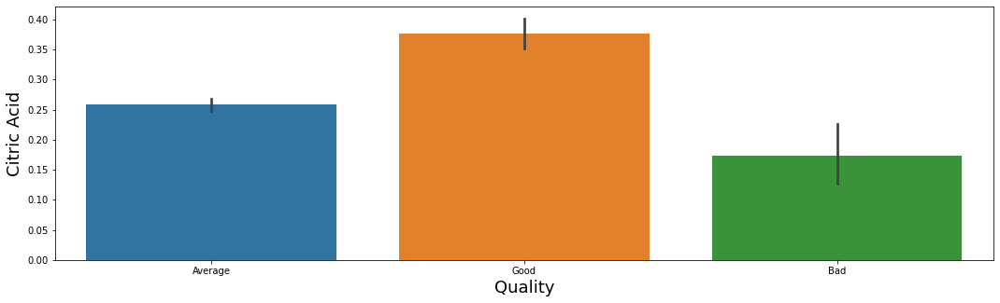

In [28]:
plt.figure(figsize=(18,5))

sns.barplot(data["quality"],data["citric acid"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Citric Acid",fontsize=18)

Text(0, 0.5, 'Citric Acid')

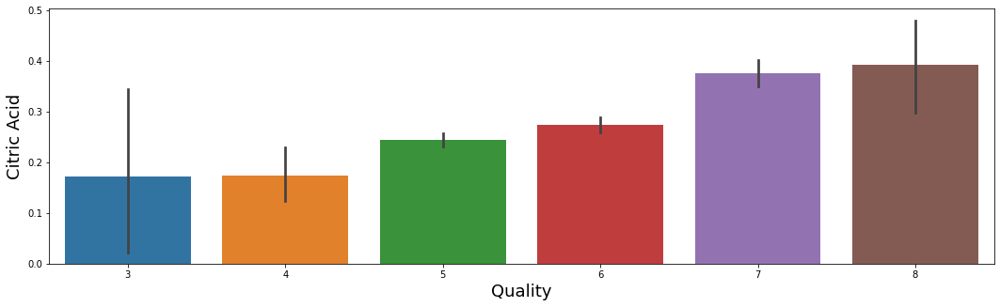

In [29]:
plt.figure(figsize=(18,5))

sns.barplot(wine["quality"],wine["citric acid"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Citric Acid",fontsize=18)

In [30]:
plt.figure(figsize=(18,5))

px.scatter(wine,x="alcohol",y="citric acid",color="quality")


<Figure size 1296x360 with 0 Axes>

In [31]:
px.box(wine, y = "citric acid",color="quality")

In [32]:
px.box(data, y = "citric acid",color="quality")

In [33]:
# residual sugar 

Text(0, 0.5, 'Residual Sugar')

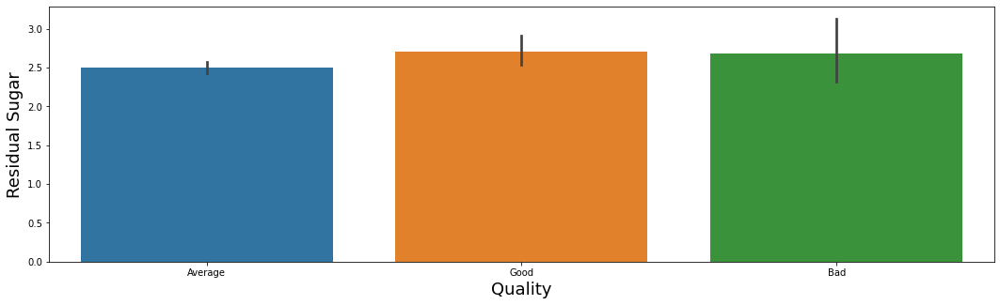

In [34]:
plt.figure(figsize=(18,5))

sns.barplot(data["quality"],data["residual sugar"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Residual Sugar",fontsize=18)

Text(0, 0.5, 'Residual Sugar')

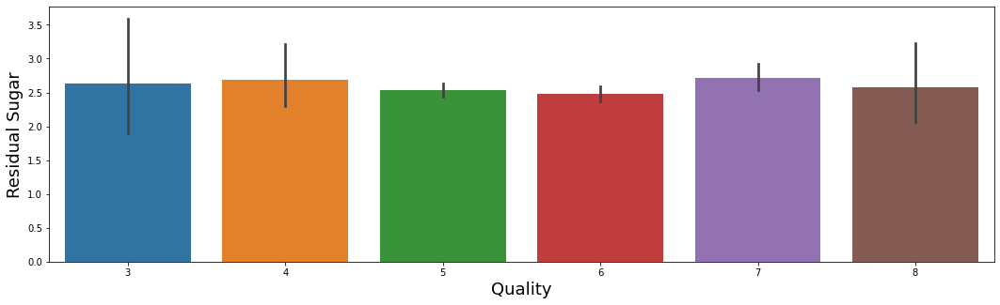

In [35]:
plt.figure(figsize=(18,5))

sns.barplot(wine["quality"],wine["residual sugar"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Residual Sugar",fontsize=18)

Text(0, 0.5, 'Residual Sugar')

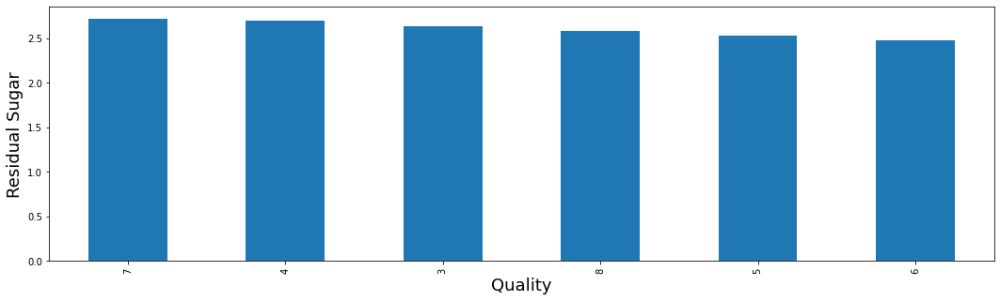

In [36]:
plt.figure(figsize=(18,5))

wine.groupby("quality")["residual sugar"].mean().sort_values(ascending=False).plot(kind="bar")
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Residual Sugar",fontsize=18)

In [37]:
plt.figure(figsize=(18,5))

px.scatter(wine,x="alcohol",y="residual sugar",color="quality")

<Figure size 1296x360 with 0 Axes>

In [38]:
px.box(wine, y = "residual sugar",color="quality")

In [39]:
px.box(data, y = "residual sugar",color="quality")

In [40]:
# chlorides

Text(0, 0.5, 'Chlorides')

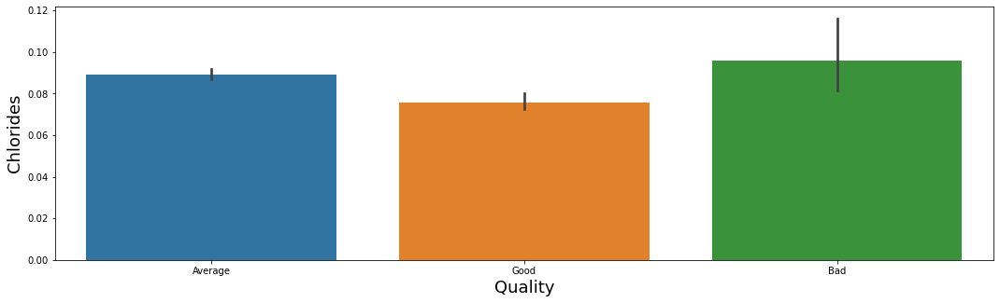

In [41]:
plt.figure(figsize=(18,5))

sns.barplot(data["quality"],data["chlorides"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Chlorides",fontsize=18)

Text(0, 0.5, 'Chlorides')

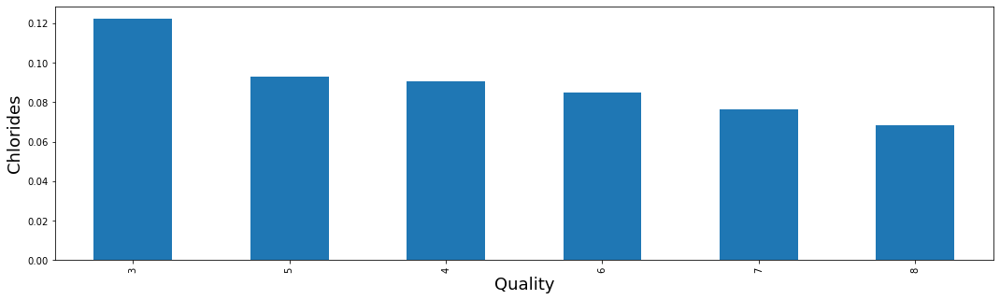

In [42]:
plt.figure(figsize=(18,5))

wine.groupby("quality")["chlorides"].mean().sort_values(ascending=False).plot(kind="bar")
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Chlorides",fontsize=18)

In [43]:
plt.figure(figsize=(18,5))

px.scatter(wine,x="alcohol",y="chlorides",color="quality")

<Figure size 1296x360 with 0 Axes>

In [44]:
px.box(wine, y = "chlorides",color="quality")

In [45]:
px.box(data, y = "chlorides",color="quality")

In [46]:
#free sulfur dioxide

Text(0, 0.5, 'free sulfur dioxide')

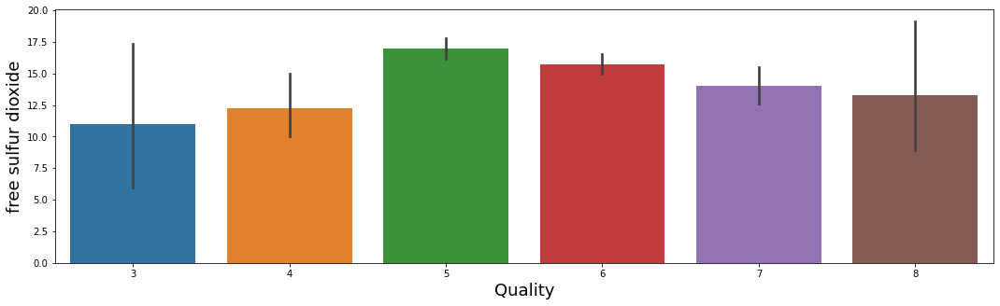

In [47]:
plt.figure(figsize=(18,5))

sns.barplot(wine["quality"],wine["free sulfur dioxide"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("free sulfur dioxide",fontsize=18)

Text(0, 0.5, 'free sulfur dioxide')

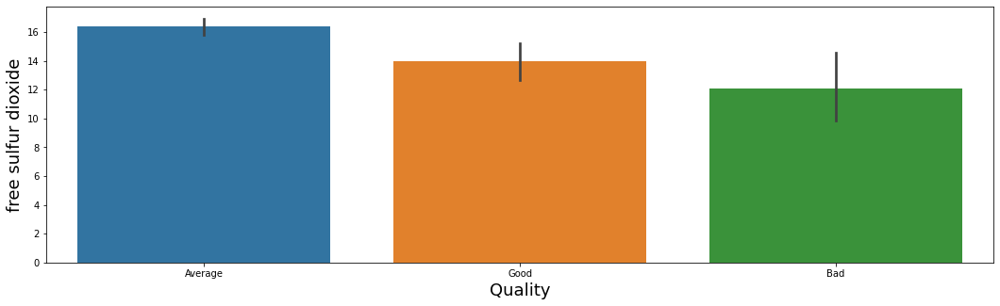

In [48]:
plt.figure(figsize=(18,5))

sns.barplot(data["quality"],data["free sulfur dioxide"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("free sulfur dioxide",fontsize=18)

Text(0, 0.5, 'free sulfur dioxide')

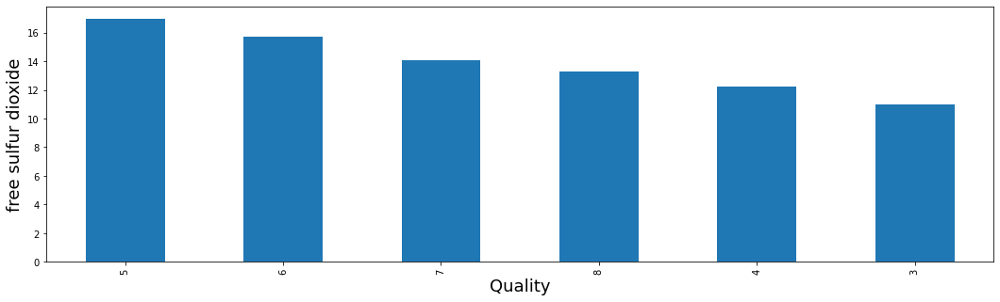

In [49]:
plt.figure(figsize=(18,5))

wine.groupby("quality")["free sulfur dioxide"].mean().sort_values(ascending=False).plot(kind="bar")
plt.xlabel("Quality",fontsize=18)
plt.ylabel("free sulfur dioxide",fontsize=18)

In [50]:
plt.figure(figsize=(18,5))

px.scatter(wine,x="alcohol",y="free sulfur dioxide",color="quality")

<Figure size 1296x360 with 0 Axes>

In [51]:
px.box(wine, y = "free sulfur dioxide",color="quality")

In [52]:
px.box(data, y = "free sulfur dioxide",color="quality")

In [53]:
# Total Sulfur Dioxide

Text(0, 0.5, 'Total sulfur dioxide')

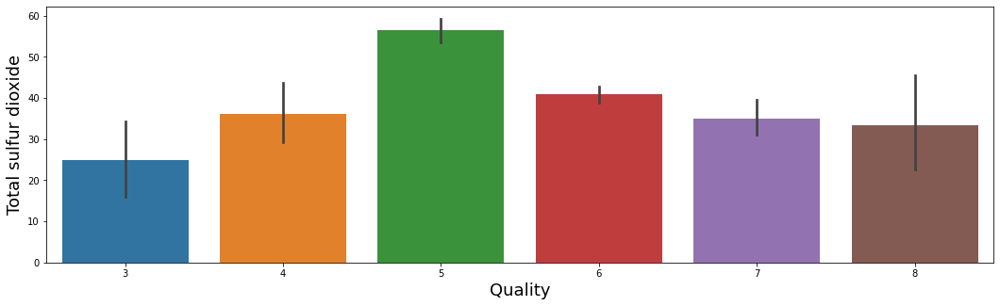

In [54]:
plt.figure(figsize=(18,5))

sns.barplot(wine["quality"],wine["total sulfur dioxide"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Total sulfur dioxide",fontsize=18)

Text(0, 0.5, 'Total sulfur dioxide')

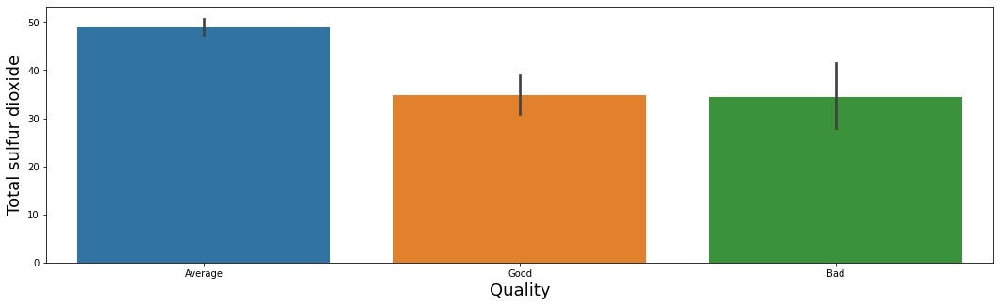

In [55]:
plt.figure(figsize=(18,5))

sns.barplot(data["quality"],data["total sulfur dioxide"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Total sulfur dioxide",fontsize=18)

Text(0, 0.5, 'Avg Total sulfur dioxide')

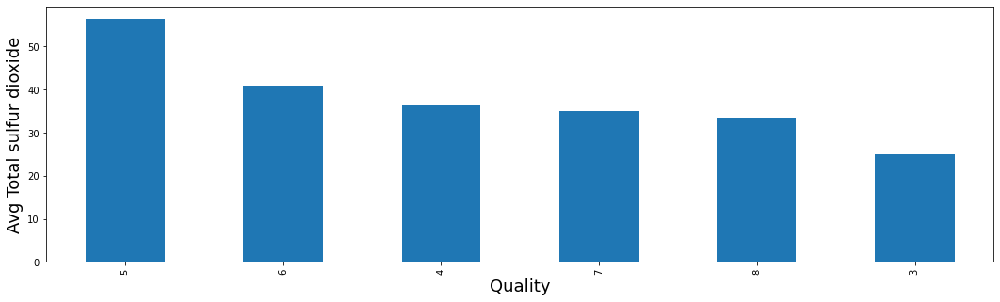

In [56]:
plt.figure(figsize=(18,5))

wine.groupby("quality")["total sulfur dioxide"].mean().sort_values(ascending=False).plot(kind="bar")
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Avg Total sulfur dioxide",fontsize=18)

In [57]:
plt.figure(figsize=(18,5))

px.scatter(wine,x="alcohol",y="total sulfur dioxide",color="quality")

<Figure size 1296x360 with 0 Axes>

In [58]:
px.box(wine, y = "total sulfur dioxide",color="quality")

In [59]:
px.box(data, y = "free sulfur dioxide",color="quality")

In [60]:
# Density

Text(0, 0.5, 'Density')

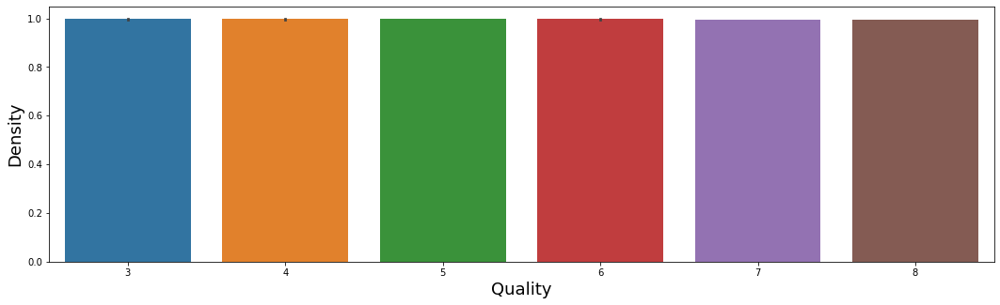

In [61]:
plt.figure(figsize=(18,5))

sns.barplot(wine["quality"],wine["density"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Density",fontsize=18)

Text(0, 0.5, 'Density')

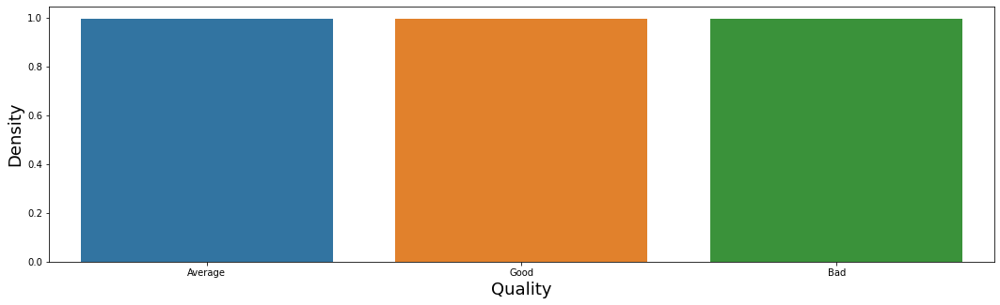

In [62]:
plt.figure(figsize=(18,5))

sns.barplot(data["quality"],data["density"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Density",fontsize=18)

Text(0, 0.5, 'Avg Density')

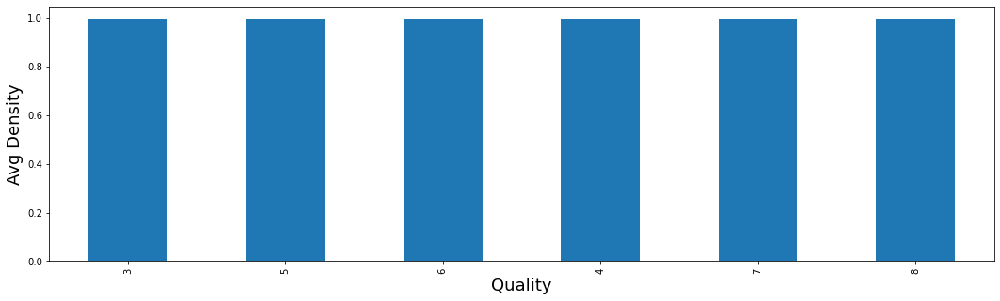

In [63]:
plt.figure(figsize=(18,5))

wine.groupby("quality")["density"].mean().sort_values(ascending=False).plot(kind="bar")
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Avg Density",fontsize=18)

Text(0, 0.5, 'Avg Density')

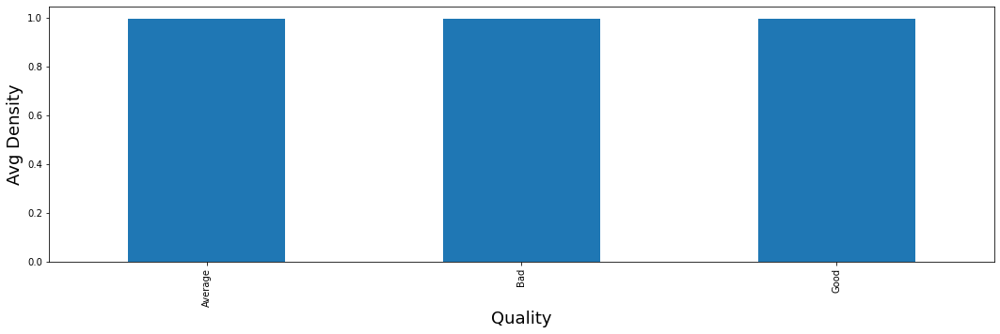

In [64]:
plt.figure(figsize=(18,5))

data.groupby("quality")["density"].mean().sort_values(ascending=False).plot(kind="bar")
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Avg Density",fontsize=18)

In [65]:
plt.figure(figsize=(18,5))

px.scatter(wine,x="alcohol",y="density",color="quality")

<Figure size 1296x360 with 0 Axes>

In [66]:
px.box(wine, y = "density",color="quality")

In [67]:
px.box(data, y = "density",color="quality")

In [68]:
# PH

Text(0, 0.5, 'PH')

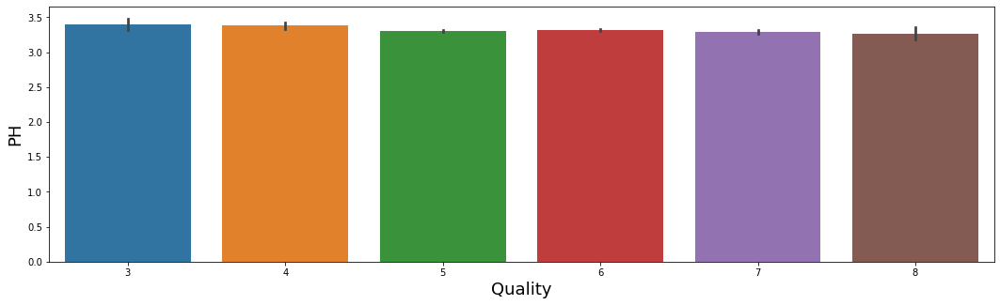

In [69]:
plt.figure(figsize=(18,5))

sns.barplot(wine["quality"],wine["pH"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("PH",fontsize=18)

Text(0, 0.5, 'PH')

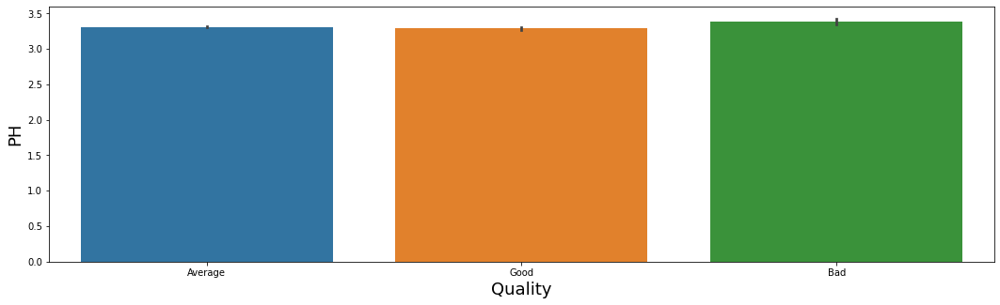

In [70]:
plt.figure(figsize=(18,5))

sns.barplot(data["quality"],data["pH"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("PH",fontsize=18)

Text(0, 0.5, 'Avg PH')

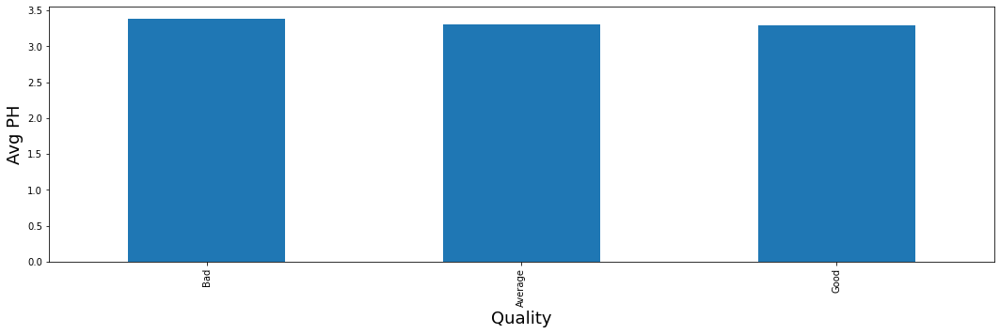

In [71]:
plt.figure(figsize=(18,5))

data.groupby("quality")["pH"].mean().sort_values(ascending=False).plot(kind="bar")
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Avg PH",fontsize=18)

In [72]:
plt.figure(figsize=(18,5))

px.scatter(wine,x="alcohol",y="pH",color="quality")

<Figure size 1296x360 with 0 Axes>

In [73]:
px.box(wine, y = "pH",color="quality")

In [74]:
px.box(data, y = "density",color="quality")

In [75]:
# Sulphates

Text(0, 0.5, 'sulphates')

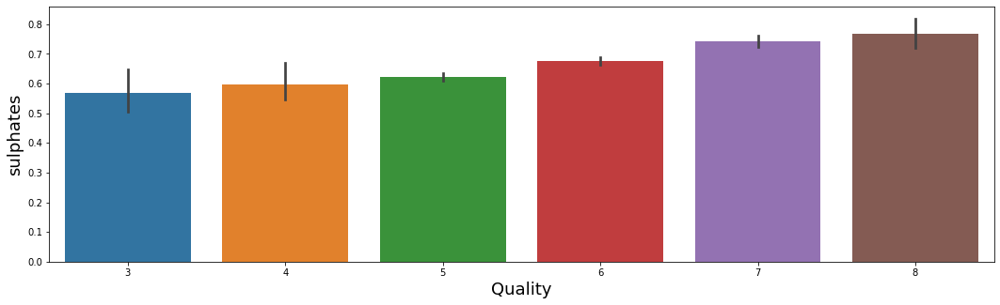

In [76]:
plt.figure(figsize=(18,5))

sns.barplot(wine["quality"],wine["sulphates"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("sulphates",fontsize=18)

Text(0, 0.5, 'sulphates')

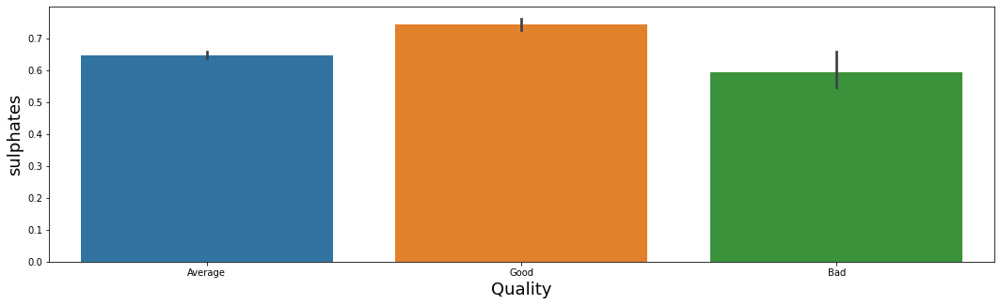

In [77]:
plt.figure(figsize=(18,5))

sns.barplot(data["quality"],data["sulphates"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("sulphates",fontsize=18)

In [78]:
plt.figure(figsize=(18,5))

px.scatter(wine,x="alcohol",y="sulphates",color="quality")

<Figure size 1296x360 with 0 Axes>

In [79]:
px.box(wine, y = "sulphates",color="quality")

In [80]:
px.box(data, y = "sulphates",color="quality")

In [81]:
# Alcohol

Text(0, 0.5, 'Alcohol')

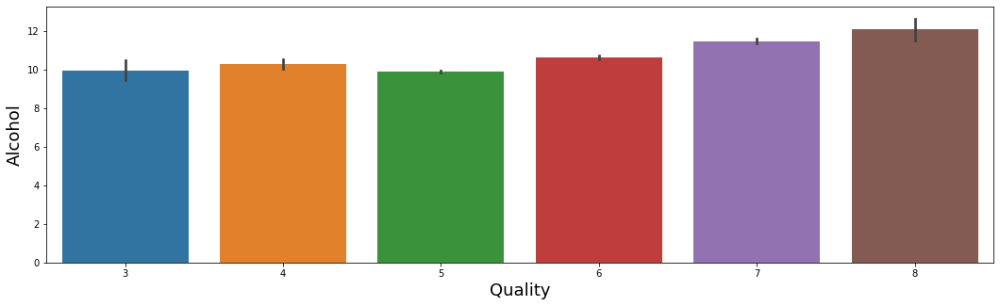

In [82]:
plt.figure(figsize=(18,5))

sns.barplot(wine["quality"],wine["alcohol"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Alcohol",fontsize=18)

Text(0, 0.5, 'Alcohol')

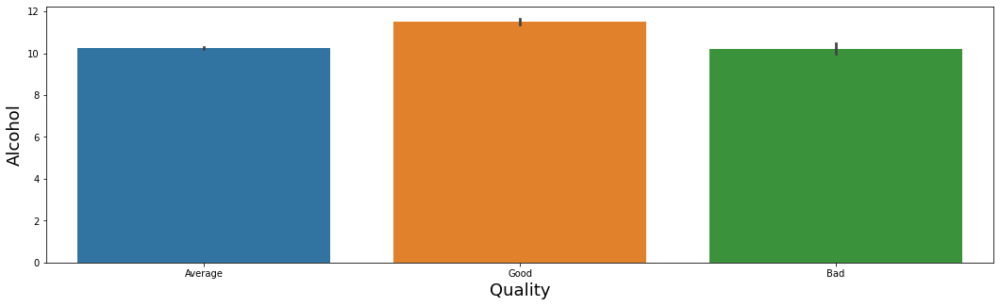

In [83]:
plt.figure(figsize=(18,5))

sns.barplot(data["quality"],data["alcohol"])
plt.xlabel("Quality",fontsize=18)
plt.ylabel("Alcohol",fontsize=18)

In [84]:
px.violin(data,x = "alcohol")

In [85]:
px.pie(data ,names ="quality")

In [86]:
px.pie(wine ,names ="quality")

In [87]:
plt.figure(figsize=(18,5))

px.scatter_3d(data, x="fixed acidity", y ="citric acid",z ="sulphates", color="quality")

<Figure size 1296x360 with 0 Axes>

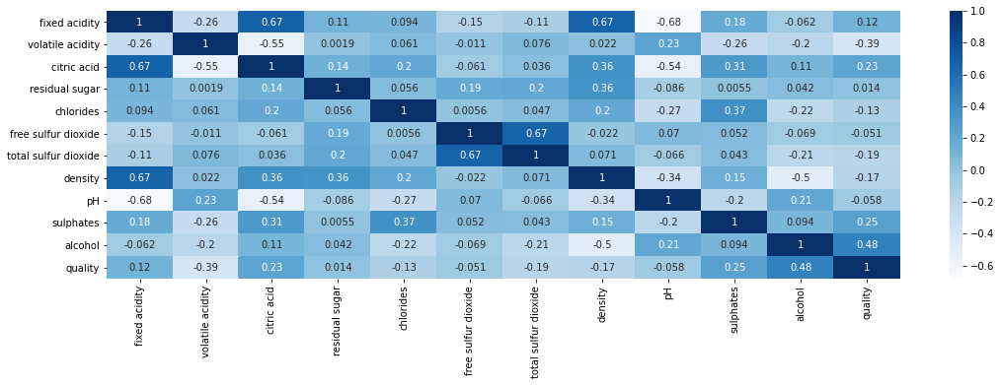

In [88]:
plt.figure(figsize=(18,5))
sns.heatmap(wine.corr(),annot=True,cmap="Blues")

In [89]:
# # train test split

In [118]:
X = wine.drop("quality",axis=1)
Y = wine["quality"]

x_train, x_test, y_train, y_test = train_test_split(X,Y,test_size=0.3,random_state=101)

In [119]:
# Naive Bayes Classifier

In [120]:
# Categorical

cnb = CategoricalNB()

cnb.fit(x_train,y_train)

prediction_on_train = cnb.predict(x_train)
prediction_on_test = cnb.predict(x_test)
print("Accuracy of train set is : {}%".format(round(accuracy_score(y_train,prediction_on_train)*100)))
print("Accuracy of test set is : {}%".format(round(accuracy_score(y_test,prediction_on_test)*100)))

Accuracy of train set is : 63.0%
Accuracy of test set is : 55.0%


Train Confusion Matrix : 



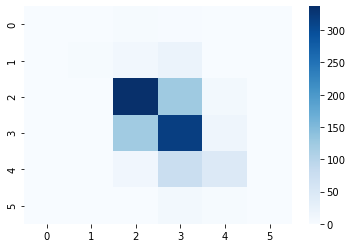

Test Confusion Matrix : 



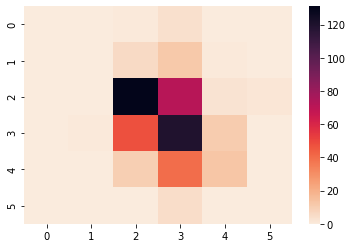

In [121]:
print("Train Confusion Matrix : \n")
sns.heatmap(confusion_matrix(y_train,prediction_on_train),cmap="Blues")
plt.show()
print("Test Confusion Matrix : \n")
sns.heatmap(confusion_matrix(y_test,prediction_on_test), cmap="rocket_r")
plt.show()

In [124]:
# Gaussian

gnb = GaussianNB()

gnb.fit(x_train,y_train)

prediction_on_train = gnb.predict(x_train)
prediction_on_test = gnb.predict(x_test)
print("Accuracy of train set is : {}%".format(round(accuracy_score(y_train,prediction_on_train)*100)))
print("Accuracy of test set is : {}%".format(round(accuracy_score(y_test,prediction_on_test)*100)))

Accuracy of train set is : 56.0%
Accuracy of test set is : 52.0%


Train Confusion Matrix : 



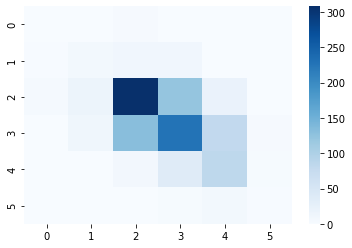

Test Confusion Matrix : 



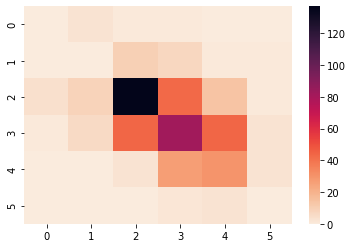

In [125]:
print("Train Confusion Matrix : \n")
sns.heatmap(confusion_matrix(y_train,prediction_on_train),cmap="Blues")
plt.show()
print("Test Confusion Matrix : \n")
sns.heatmap(confusion_matrix(y_test,prediction_on_test), cmap="rocket_r")
plt.show()